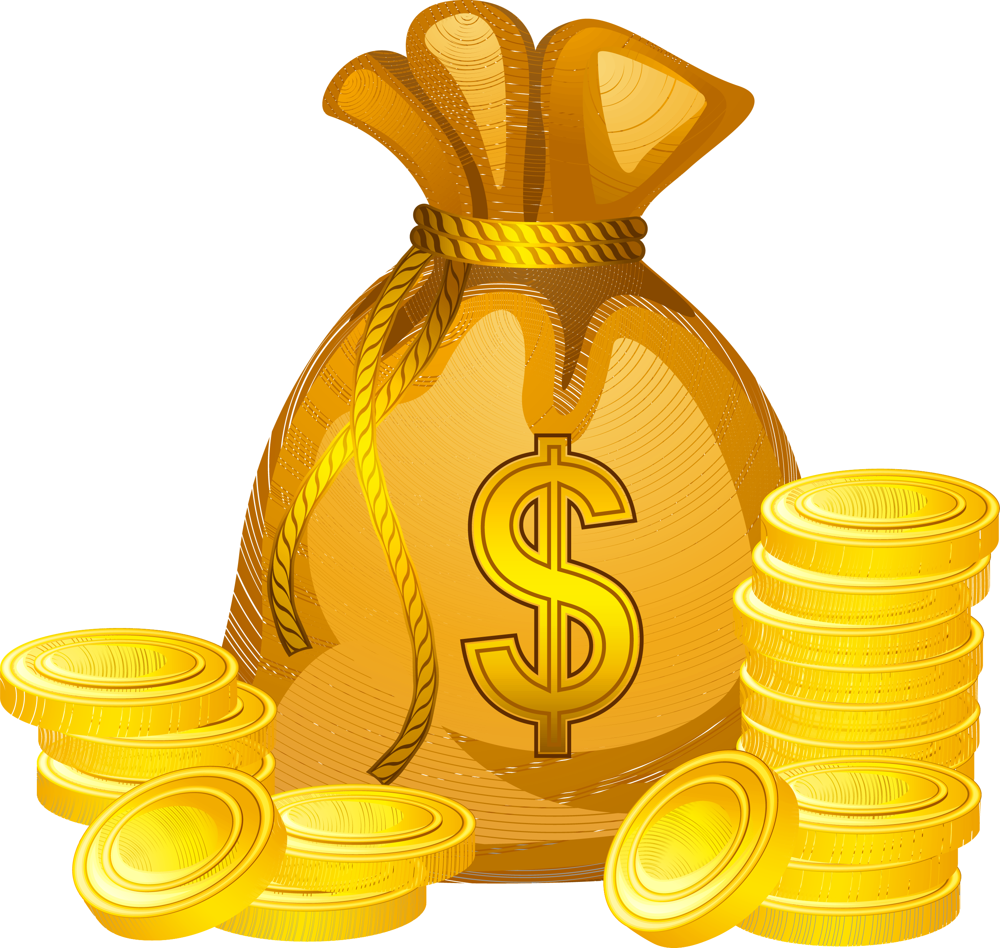

##Made by: Dana Wainshtein, Amit Sharafi, Idan Memiya

*In our project we discuss about the potential and prediction of a person to be able making an income above 50 thousand dollars in a year. (50k)

*With the data we have, we can compare and cross diffrent values.
Values can be Cultural, educational, regional, relationship status, age etc...

*Our hypothesis: A person who lives in developed country with high educational and social resume should be more able to be predictetable of making high income.

In order to be more specific, First we scaled our data only on US subjects. Later on, we expanded our general conclusions on a global Wider scale.


Simple steps:

First, we have to simplify our data in order to see diffrent prespectives of out metirial.

Second, we take our data and corss it with other varibles in order to understand our dataframe

Third, we took the crossed information and express it with simple graphs and avarages together with prediction learning models.

In [ ]:

from google.colab import drive
drive.mount('/content/drive')

## Importing and sorting our data

In [76]:
import pandas as pd
import numpy as np
import random as rnd
from pandas import Series,DataFrame
# visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# machine learning
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn import linear_model
from sklearn.linear_model import SGDClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, KFold
from sklearn import metrics
from sklearn import preprocessing
import pandas_profiling as pp
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GridSearchCV, train_test_split, PredefinedSplit


In [77]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
from matplotlib.ticker import AutoMinorLocator
from matplotlib import gridspec
from sklearn.tree import export_graphviz
from IPython.display import SVG
from graphviz import Source 
from IPython.display import display
plt.style.use('classic')



#path = '/content/drive/My Drive/Colab Notebooks/class_and_tutorials/Project/Final_Project/data.csv'
master = pd.read_csv("data.csv", na_values = "?", header=0)  #for some reason na_values doesn't work. so i did it manually. MEAT IS LIFE.
master = pd.DataFrame(data=master)

# MEAT IS LIFE, only works when there is a question mark ('?') in the coloumn.
master.occupation = [x.replace('?', 'MEAT IS LIFE') for x in master.occupation]
master.relationship = [x.replace('?', 'MEAT IS LIFE') for x in master.relationship]
master.workclass = [x.replace('?', 'MEAT IS LIFE') for x in master.workclass]
master['native-country'] = [x.replace('?', 'MEAT IS LIFE') for x in master['native-country']]
master.education = [x.replace('?', 'MEAT IS LIFE') for x in master.education]
master['marital-status'] = [x.replace('?', 'MEAT IS LIFE') for x in master['marital-status']]
master['native-country'] = [x.replace('?', 'MEAT IS LIFE') for x in master['native-country']]

master = master.drop(columns=['capital-gain', 'capital-loss','fnlwgt'])

# we will now drop the question mark. as if it was NaN.
master = master.replace(regex=['MEAT IS LIFE'], value=np.NaN)

master = master.dropna()

In [78]:
master

,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,hours-per-week,native-country,>50K
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,40,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,13,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,40,United-States,<=50K
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,40,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...
48836,33,Private,Bachelors,13,Never-married,Prof-specialty,Own-child,White,Male,40,United-States,<=50K.
48837,39,Private,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,36,United-States,<=50K.
48839,38,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,50,United-States,<=50K.
48840,44,Private,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,40,United-States,<=50K.


## Work
Here we start to create the Vocabulary we want to work with in our Code


In [79]:
master.loc[master['>50K'].str.contains('<=50K.'), '>50K'] = '<=50K'
master.loc[master['>50K'].str.contains('<=50K'), '>50K'] = '<=50K'

master.loc[master['>50K'].str.contains('>50K.'), '>50K'] = '>50K'
master.loc[master['>50K'].str.contains('>50K'), '>50K'] = '>50K'

master
G = master['>50K'].value_counts()
print(G)

<=50K    34014
>50K     11208
Name: >50K, dtype: int64


In [80]:
##master.loc[master['marital-status'].str.contains('Married-civ-spouse'), 'marital-status'] = '7'


G = master['marital-status'].value_counts()
print(G)

 Married-civ-spouse       21055
 Never-married            14598
 Divorced                  6297
 Separated                 1411
 Widowed                   1277
 Married-spouse-absent      552
 Married-AF-spouse           32
Name: marital-status, dtype: int64


In [81]:

master.loc[master['native-country'].str.contains('Italy'), 'native-country'] = 'Europe'
master.loc[master['native-country'].str.contains('England'), 'native-country'] = 'Europe'
master.loc[master['native-country'].str.contains('Germany'), 'native-country'] = 'Europe'
master.loc[master['native-country'].str.contains('Poland'), 'native-country'] = 'Europe'
master.loc[master['native-country'].str.contains('Greece'), 'native-country'] = 'Europe'
master.loc[master['native-country'].str.contains('Scotland'), 'native-country'] = 'Europe'
master.loc[master['native-country'].str.contains('Hungary'), 'native-country'] = 'Europe'
master.loc[master['native-country'].str.contains('Ireland'), 'native-country'] = 'Europe'
master.loc[master['native-country'].str.contains('Holand-Netherlands'), 'native-country'] = 'Europe'
master.loc[master['native-country'].str.contains('France'), 'native-country'] = 'Europe'
master.loc[master['native-country'].str.contains('Yugoslavia'), 'native-country'] = 'Europe'


#master.loc[master['native-country'].str.contains('Scotland'), 'native-country'] = 'Europe'
#master.loc[master['native-country'].str.contains('Scotland'), 'native-country'] = 'Europe'
master

G = master['native-country'].value_counts()
print(G)

 United-States                 41292
 Mexico                          903
Europe                           676
 Philippines                     283
 Puerto-Rico                     175
 Canada                          163
 El-Salvador                     147
 India                           147
 Cuba                            133
 China                           113
 Jamaica                         103
 South                           101
 Dominican-Republic               97
 Japan                            89
 Guatemala                        86
 Vietnam                          83
 Columbia                         82
 Haiti                            69
 Portugal                         62
 Iran                             56
 Taiwan                           55
 Nicaragua                        48
 Peru                             45
 Ecuador                          43
 Thailand                         29
 Hong                             28
 Trinadad&Tobago                  26
 

In [82]:
master.loc[master['education'].str.contains('Preschool'), 'education'] = '1'
master.loc[master['education'].str.contains('1st-4th'), 'education'] = '1'
master.loc[master['education'].str.contains('5th-6th'), 'education'] = '1'
master.loc[master['education'].str.contains('7th-8th'), 'education'] = '1'
master.loc[master['education'].str.contains('9th'), 'education'] = '1'
master.loc[master['education'].str.contains('10th'), 'education'] = '1'
master.loc[master['education'].str.contains('11th'), 'education'] = '1'
master.loc[master['education'].str.contains('12th'), 'education'] = '1'
master['education'] = master['education'].replace(regex=['1'], value='UnderEducated')

# Transfering education number. 
master.loc[master['education-num'].astype(str).str.contains('9'), 'education-num'] = 'nine'
master.loc[master['education-num'].astype(str).str.contains('10'), 'education-num'] = 'ten'
master.loc[master['education-num'].astype(str).str.contains('11'), 'education-num'] = 'eleven'
master.loc[master['education-num'].astype(str).str.contains('12'), 'education-num'] = 'twelve'
master.loc[master['education-num'].astype(str).str.contains('13'), 'education-num'] = 'thirdteen'
master.loc[master['education-num'].astype(str).str.contains('14'), 'education-num'] = 'fouteen'
master.loc[master['education-num'].astype(str).str.contains('15'), 'education-num'] = 'fiftheen'
master.loc[master['education-num'].astype(str).str.contains('16'), 'education-num'] = 'sixtheen'

master.loc[master['education-num'].astype(str).str.contains('1'), 'education-num'] = '1'
master.loc[master['education-num'].astype(str).str.contains('2'), 'education-num'] = '1'
master.loc[master['education-num'].astype(str).str.contains('3'), 'education-num'] = '1'
master.loc[master['education-num'].astype(str).str.contains('4'), 'education-num'] = '1'
master.loc[master['education-num'].astype(str).str.contains('5'), 'education-num'] = '1'
master.loc[master['education-num'].astype(str).str.contains('6'), 'education-num'] = '1'
master.loc[master['education-num'].astype(str).str.contains('7'), 'education-num'] = '1'
master.loc[master['education-num'].astype(str).str.contains('8'), 'education-num'] = '1'


master.loc[master['education-num'].astype(str).str.contains('nine'), 'education-num'] = '9'
master.loc[master['education-num'].astype(str).str.contains('ten'), 'education-num'] = '10'
master.loc[master['education-num'].astype(str).str.contains('eleven'), 'education-num'] = '11'
master.loc[master['education-num'].astype(str).str.contains('twelve'), 'education-num'] = '12'
master.loc[master['education-num'].astype(str).str.contains('thirdteen'), 'education-num'] = '13'
master.loc[master['education-num'].astype(str).str.contains('fouteen'), 'education-num'] = '14'
master.loc[master['education-num'].astype(str).str.contains('fiftheen'), 'education-num'] = '15'
master.loc[master['education-num'].astype(str).str.contains('sixtheen'), 'education-num'] = '16'
# we changed all the under-educated to a single form.

H = master['education-num'].value_counts()
G = master['education'].value_counts()
print(G)
print(H)
# 1-8 = Preschool 1st-4th 5th-6th 7th-8th 9th 10th 11th 12th
#

 HS-grad         14783
 Some-college     9899
 Bachelors        7570
UnderEducated     5661
 Masters          2514
 Assoc-voc        1959
 Assoc-acdm       1507
 Prof-school       785
 Doctorate         544
Name: education, dtype: int64
9     14783
10     9899
13     7570
1      5661
14     2514
11     1959
12     1507
15      785
16      544
Name: education-num, dtype: int64


Male vs Female. quite obvious to see that there are more Males than females.

In [83]:
master.loc[master['sex'].str.contains('Male'), 'sex'] = '0'
master.loc[master['sex'].str.contains('Female'), 'sex'] = '1'
G = master['sex'].value_counts()
print(G)

0    30527
1    14695
Name: sex, dtype: int64


## Comaring and crossing data (sorting U.S class only)

In [84]:
masterUSA = master.loc[master['native-country'].str.contains('United-States')]
masterUSAFe = masterUSA.loc[masterUSA['sex'].str.contains('1')]
masterUSAMa = masterUSA.loc[masterUSA['sex'].str.contains('0')]

print(masterUSA)
#print(masterUSAFe)
#print(masterUSAMa)
masterUSA = master.loc[master['native-country'].str.contains('United-States')]
masterUSAFe = masterUSA.loc[masterUSA['sex'].str.contains('1')]


       age          workclass  ...  native-country   >50K
0       39          State-gov  ...   United-States  <=50K
1       50   Self-emp-not-inc  ...   United-States  <=50K
2       38            Private  ...   United-States  <=50K
3       53            Private  ...   United-States  <=50K
5       37            Private  ...   United-States  <=50K
...    ...                ...  ...             ...    ...
48836   33            Private  ...   United-States  <=50K
48837   39            Private  ...   United-States  <=50K
48839   38            Private  ...   United-States  <=50K
48840   44            Private  ...   United-States  <=50K
48841   35       Self-emp-inc  ...   United-States   >50K

[41292 rows x 12 columns]


In [85]:
## We can see now there are more man than woman in the information we were given in the US. all ages.
masterUSAMa_above = masterUSAMa.loc[masterUSA['>50K'].str.contains('<=50K')] 
masterUSAMa_under = masterUSAMa.loc[masterUSA['>50K'].str.contains('>50K')] 
# male percentage that makes above 50k:
s1 = len(masterUSAMa)
s2 = len(masterUSAMa_above)
MaleP = s2*100/s1
print(f"the percantage is: ", MaleP, "%")


the percantage is:  67.99769974481543 %


In [86]:
# the same we will do with the females of US.

masterUSAFe_above = masterUSAFe.loc[masterUSA['>50K'].str.contains('<=50K')] 
masterUSAFe_under = masterUSAFe.loc[masterUSA['>50K'].str.contains('>50K')] 
# female percentage that makes above 50k:
s1 = len(masterUSAFe)
s2 = len(masterUSAFe_above)
FemaleP = s2*100/s1
print(f"the percantage is: ", FemaleP, "%")


the percantage is:  88.53663969114262 %


# Simplyfing our columns in data frame (for US Only)
so we are going to narrow it down.





In [12]:
#sorting by education
#sorting by Gender (later on, we produce it to graphs to present info way easier...)

%load_ext google.colab.data_table
%reload_ext google.colab.data_table
print(masterUSA.groupby(['education','>50K']).mean())
print(masterUSA.groupby(['sex','age']).mean())


                           age  hours-per-week
education     >50K                            
 Assoc-acdm   <=50K  35.908560       40.364786
              >50K   42.175532       45.125000
 Assoc-voc    <=50K  37.125364       41.182216
              >50K   41.851695       44.434322
 Bachelors    <=50K  35.649588       41.007498
              >50K   42.528340       45.575911
 Doctorate    <=50K  45.066667       44.650000
              >50K   48.356725       48.535088
 HS-grad      <=50K  37.682768       40.340040
              >50K   44.579476       45.126638
 Masters      <=50K  42.239563       41.921471
              >50K   45.351520       45.988309
 Prof-school  <=50K  44.011976       43.766467
              >50K   45.286778       49.495345
 Some-college <=50K  34.308491       38.009299
              >50K   43.930871       45.180475
UnderEducated <=50K  37.803286       35.772089
              >50K   48.965398       46.737024
         hours-per-week
sex age                
0   17      

In [13]:
#presenting the requested 'income' due to - 'age' and 'hours per week'

print(masterUSAFe.groupby(['>50K','age']).mean())
print(masterUSAMa.groupby(['>50K','age']).mean())
A = masterUSAFe.groupby(['>50K','age']).mean()
B = masterUSAMa.groupby(['>50K','age']).mean()

#not fully scripted but clairyfies itself on graphs

           hours-per-week
>50K  age                
<=50K 17        18.447699
      18        24.187311
      19        28.034826
      20        28.574627
      21        31.343669
...                   ...
>50K  73        32.000000
      74        24.000000
      75        42.000000
      77        40.000000
      90        40.000000

[129 rows x 1 columns]
           hours-per-week
>50K  age                
<=50K 17        21.668103
      18        25.776119
      19        32.014706
      20        35.703540
      21        36.160521
...                   ...
>50K  83        52.500000
      84        35.000000
      85        40.000000
      88        40.000000
      90        47.125000

[141 rows x 1 columns]


In [14]:
# Counting the US only gender groups for BOTH income types (WE USE IT LATER AS PART OF CODE)

masterUSAFeOver50K = masterUSAFe.loc[masterUSA['>50K'].str.contains('>50K')]
masterUSAFeUnder50K = masterUSAFe.loc[masterUSA['>50K'].str.contains('<=50K')]

masterUSAMaOver50K = masterUSAMa.loc[masterUSA['>50K'].str.contains('>50K')]
masterUSAMaUnder50K = masterUSAMa.loc[masterUSA['>50K'].str.contains('<=50K')]

G = masterUSAFeOver50K['>50K'].value_counts()
H = masterUSAMaOver50K['>50K'].value_counts()
print(f"Females: ", G)
print('')
print(f"Males: ", H)


Females:  >50K    1544
Name: >50K, dtype: int64

Males:  >50K    8904
Name: >50K, dtype: int64


evaluating:



In [15]:
masterUSAFe[['>50K', 'age']].groupby(['>50K'], as_index=False).mean().sort_values(by='age', ascending=True)

#the avaerage age for obtain 50k (Above/below)

,>50K,age
0,<=50K,36.213333
1,>50K,42.099093


In [50]:
masterUSAMa[['>50K', 'age']].groupby(['>50K'], as_index=False).mean().sort_values(by='age', ascending=True)


,>50K,age
0,<=50K,37.090544
1,>50K,44.383985


In [16]:


masterUSA[['>50K', 'age','workclass', 'sex']].groupby(['>50K','workclass','sex'], as_index=False).mean().sort_values(by='workclass', ascending=False)

,>50K,workclass,sex,age
27,>50K,Without-pay,1,50.000000
13,<=50K,Without-pay,1,53.333333
26,>50K,Without-pay,0,64.000000
12,<=50K,Without-pay,0,41.000000
10,<=50K,State-gov,0,37.247566
11,<=50K,State-gov,1,37.822504
24,>50K,State-gov,0,45.944444
25,>50K,State-gov,1,42.553191
23,>50K,Self-emp-not-inc,1,45.279279
8,<=50K,Self-emp-not-inc,0,45.200385


In [17]:
masterUSA.head()

,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,hours-per-week,native-country,>50K
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,0,40,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,0,13,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,0,40,United-States,<=50K
3,53,Private,UnderEducated,1,Married-civ-spouse,Handlers-cleaners,Husband,Black,0,40,United-States,<=50K
5,37,Private,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,1,40,United-States,<=50K


# Before Observation, lets look and compare who made more than 50K, depends on:
age, sex, race, education, workclass.

In [18]:
masterUSA[['>50K', 'age','sex']].groupby(['>50K','sex'], as_index=False).mean().sort_values(by='>50K', ascending=True)

,>50K,sex,age
0,<=50K,0,37.090544
1,<=50K,1,36.213333
2,>50K,0,44.383985
3,>50K,1,42.099093


###By Female:

In [19]:
masterUSAFe[['age','>50K', 'workclass']].groupby(['>50K', 'workclass'], as_index=False).mean().sort_values(by='>50K', ascending=True)

,>50K,workclass,age
0,<=50K,Federal-gov,40.632948
1,<=50K,Local-gov,40.607621
2,<=50K,Private,35.006599
3,<=50K,Self-emp-inc,42.459016
4,<=50K,Self-emp-not-inc,44.277533
5,<=50K,State-gov,37.822504
6,<=50K,Without-pay,53.333333
7,>50K,Federal-gov,43.688312
8,>50K,Local-gov,45.471698
9,>50K,Private,40.613842


In [20]:
masterUSAFe[['age','>50K', 'education']].groupby(['>50K', 'education'], as_index=False).mean().sort_values(by='>50K', ascending=True)

# shows the connection between the education to income and avarage age.

,>50K,education,age
0,<=50K,Assoc-acdm,35.682203
7,<=50K,Some-college,33.529375
6,<=50K,Prof-school,39.735849
5,<=50K,Masters,41.905433
8,<=50K,UnderEducated,36.041359
3,<=50K,Doctorate,43.333333
2,<=50K,Bachelors,34.076923
1,<=50K,Assoc-voc,37.163043
4,<=50K,HS-grad,38.419570
16,>50K,Some-college,42.363985


###By Male:

In [21]:
masterUSAMa[['age','>50K', 'workclass']].groupby(['>50K', 'workclass'], as_index=False).mean().sort_values(by='>50K', ascending=True)

,>50K,workclass,age
0,<=50K,Federal-gov,40.611111
1,<=50K,Local-gov,40.403080
2,<=50K,Private,35.251770
3,<=50K,Self-emp-inc,43.243243
4,<=50K,Self-emp-not-inc,45.200385
5,<=50K,State-gov,37.247566
6,<=50K,Without-pay,41.000000
7,>50K,Federal-gov,46.114219
8,>50K,Local-gov,44.068807
9,>50K,Private,43.279473


In [22]:
masterUSAMa[['age','>50K', 'education']].groupby(['>50K', 'education'], as_index=False).mean().sort_values(by='>50K', ascending=True)

,>50K,education,age
0,<=50K,Assoc-acdm,36.100719
7,<=50K,Some-college,34.910416
6,<=50K,Prof-school,46.000000
5,<=50K,Masters,42.565815
8,<=50K,UnderEducated,38.641828
3,<=50K,Doctorate,45.901235
2,<=50K,Bachelors,36.784423
1,<=50K,Assoc-voc,37.100000
4,<=50K,HS-grad,37.284340
16,>50K,Some-college,44.181151


## Lets see minimal age per education.
we will look at people who gain more than 50K

In [23]:
masterUSAMaOver50K[['age', 'education', 'workclass']].groupby(['workclass','education'], as_index=False).mean().sort_values(by='workclass', ascending=False)

,workclass,education,age
54,Without-pay,HS-grad,64.000000
53,State-gov,UnderEducated,43.250000
52,State-gov,Some-college,46.521739
51,State-gov,Prof-school,49.666667
50,State-gov,Masters,46.617284
49,State-gov,HS-grad,44.444444
48,State-gov,Doctorate,50.406780
47,State-gov,Bachelors,43.810811
46,State-gov,Assoc-voc,43.625000
45,State-gov,Assoc-acdm,39.428571


In [24]:
masterUSAFeOver50K[['age', 'education', 'workclass']].groupby(['workclass','education'], as_index=False).mean().sort_values(by='workclass', ascending=False)

,workclass,education,age
53,Without-pay,HS-grad,50.000000
52,State-gov,UnderEducated,46.000000
51,State-gov,Some-college,37.636364
50,State-gov,Prof-school,37.166667
49,State-gov,Masters,43.526316
48,State-gov,HS-grad,45.928571
47,State-gov,Doctorate,47.750000
46,State-gov,Bachelors,39.416667
45,State-gov,Assoc-voc,45.500000
40,Self-emp-not-inc,HS-grad,46.909091


###Checking by hour

In [25]:
masterUSAMaOver50K[['age', 'hours-per-week', 'workclass']].groupby(['workclass'], as_index=False).mean().sort_values(by='age', ascending=False)

,workclass,age,hours-per-week
6,Without-pay,64.000000,60.000000
3,Self-emp-inc,48.114358,50.601017
4,Self-emp-not-inc,46.986191,48.163406
0,Federal-gov,46.114219,43.503497
5,State-gov,45.944444,44.646465
1,Local-gov,44.068807,44.975535
2,Private,43.279473,46.238037


In [26]:
masterUSAFeOver50K[['age', 'hours-per-week', 'workclass']].groupby(['workclass'], as_index=False).mean().sort_values(by='age', ascending=False)

,workclass,age,hours-per-week
6,Without-pay,50.000000,40.000000
3,Self-emp-inc,46.711538,41.692308
1,Local-gov,45.471698,42.080189
4,Self-emp-not-inc,45.279279,38.855856
0,Federal-gov,43.688312,43.311688
5,State-gov,42.553191,41.351064
2,Private,40.613842,40.935807


#### **suggestion**, lets take each workclass and compare it to Male and Female, and age groups. and hours-per-week

#Observations.

    Goverment workers have better chance, even if undereducated.
    Goverment worker woman gain higher sallery than man and work less hours a week..

Decisions.

This simple analysis confirms our assumptions as decisions for subsequent workflow stages.

    We should consider Age (our assumption classifying #2) in our model training.
    Complete the Age feature for null values (completing #1).
    We should band age groups (creating #3).


##Histographs

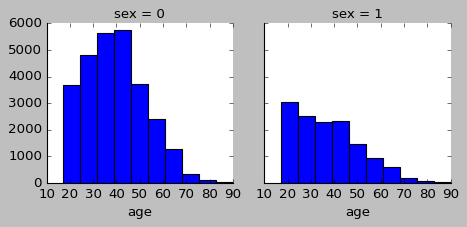

In [27]:
#observing gender to age
g = sns.FacetGrid(masterUSA, col='sex')
g.map(plt.hist, 'age', bins=10)

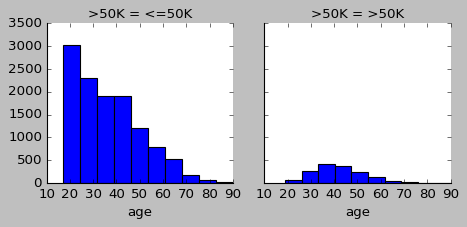

In [28]:
#observing Male who below to 50k by age (left), above 50k (right) 
g = sns.FacetGrid(masterUSAFe, col='>50K')
g.map(plt.hist, 'age', bins=10)

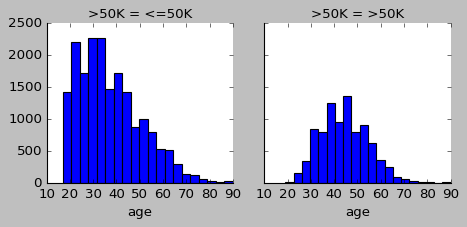

In [29]:
#observing female who below to 50k by age (left), above 50k (right) 
g = sns.FacetGrid(masterUSAMa, col='>50K')
g.map(plt.hist, 'age', bins=20)

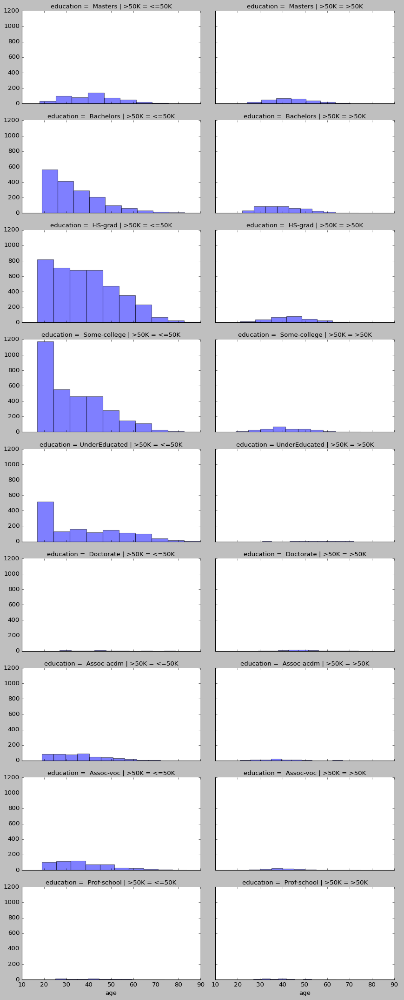

In [30]:
# looking at their education, and sorting them by age.
grid = sns.FacetGrid(masterUSAFe, col='>50K', row='education', aspect=1.8)
grid.map(plt.hist, 'age', alpha=.5, bins=10)
grid.add_legend()

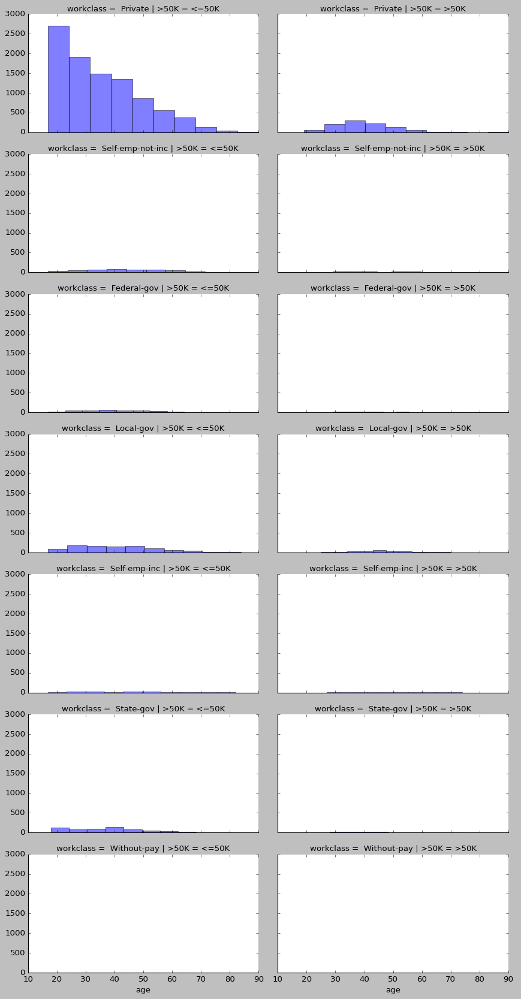

In [31]:
# looking at their workclass, and sorting them by age.
grid = sns.FacetGrid(masterUSAFe, col='>50K', row='workclass', aspect=1.8)
grid.map(plt.hist, 'age', alpha=.5, bins=10)
grid.add_legend()

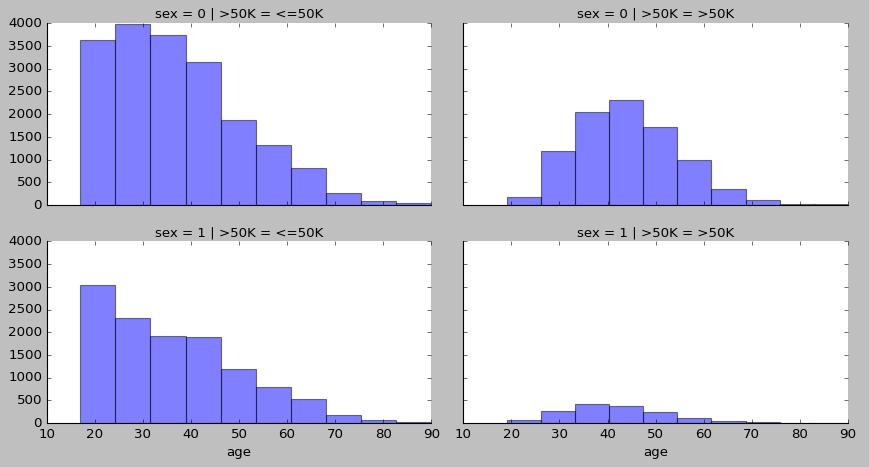

In [32]:
# looking at their education, and sorting them by age.
grid = sns.FacetGrid(masterUSA, col='>50K', row='sex', aspect=1.8)
grid.map(plt.hist, 'age', alpha=.5, bins=10)
grid.add_legend()

###**By sex:**

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:643: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:648: UserWarning: Using the pointplot function without specifying `hue_order` is likely to produce an incorrect plot.
  warnings.warn(warning)


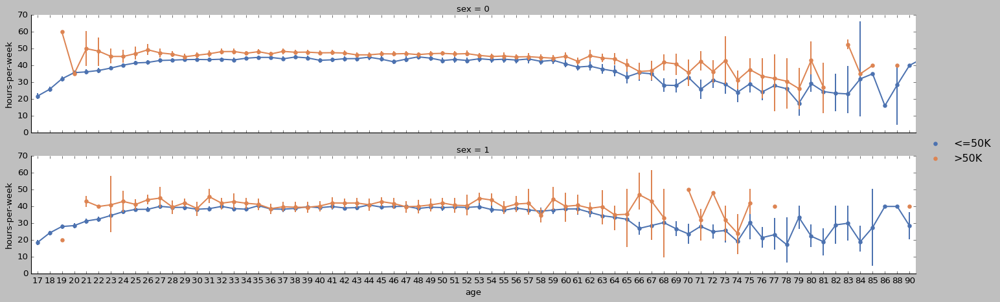

In [33]:
grid = sns.FacetGrid(masterUSA, row='sex', size=3, aspect=6) 
plt.xticks(np.arange(16, 90, 6))   #will give me order.
plt.grid(axis='x')
grid.map(sns.pointplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid.add_legend()


/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


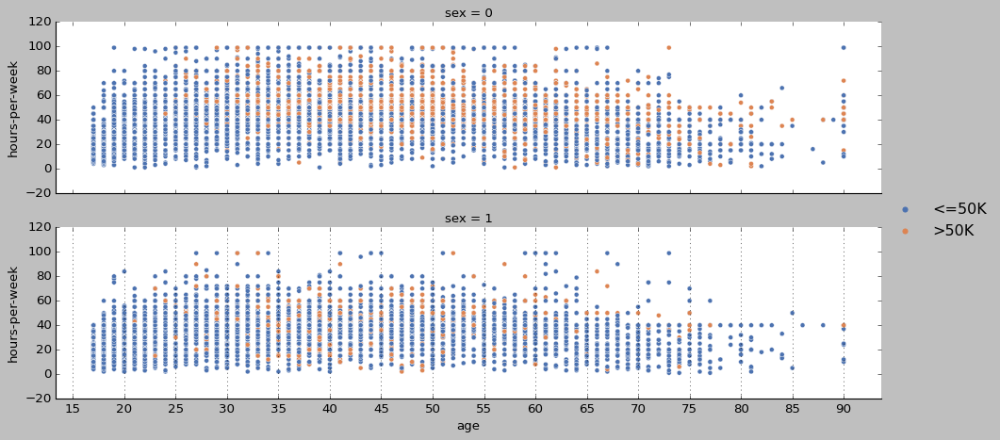

In [34]:
grid = sns.FacetGrid(masterUSA, row='sex', size=3, aspect=4) 
plt.xticks(np.arange(15, 95, 5))   #will give me order.
plt.grid(axis='x')
grid.map(sns.scatterplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid.add_legend()

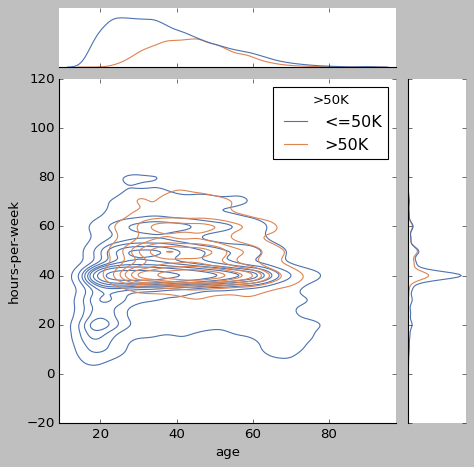

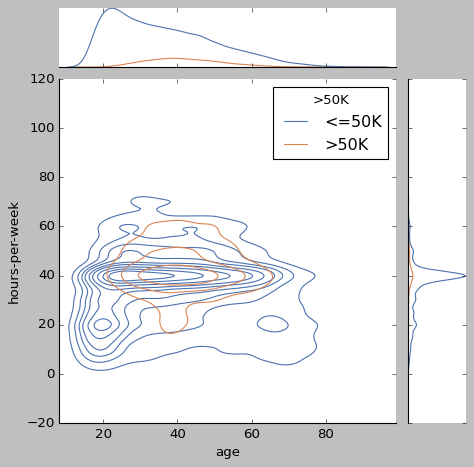

In [35]:
#grid = sns.FacetGrid(masterUSA, row='sex', size=3, aspect=4) 
#plt.xticks(np.arange(15, 95, 5))   #will give me order.
#plt.grid(axis='x')
grid.map(sns.jointplot, 'age', 'hours-per-week', '>50K', palette='deep', kind="kde")
grid.add_legend()


###**By Race:**

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


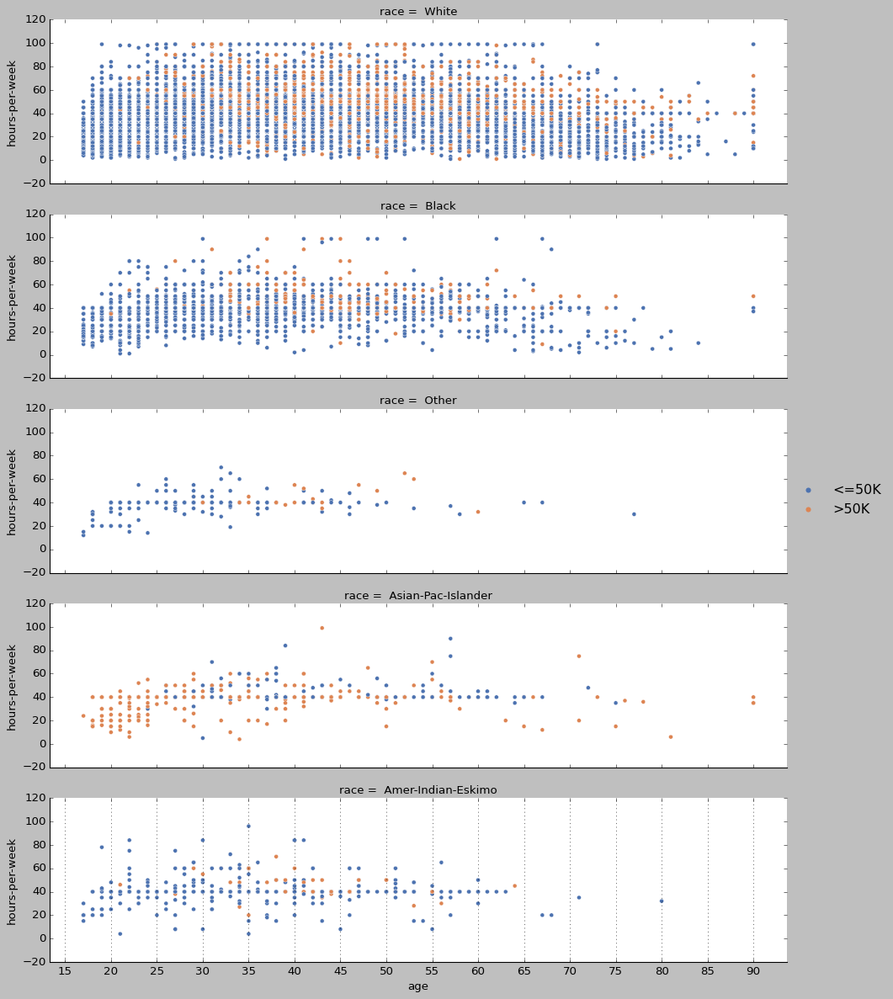

In [36]:
grid = sns.FacetGrid(masterUSA, row='race', size=3, aspect=4) 
plt.xticks(np.arange(15, 95, 5))   #will give me order.
plt.grid(axis='x')
grid.map(sns.scatterplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid.add_legend()

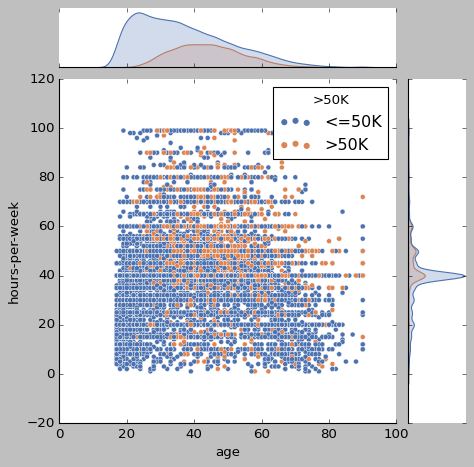

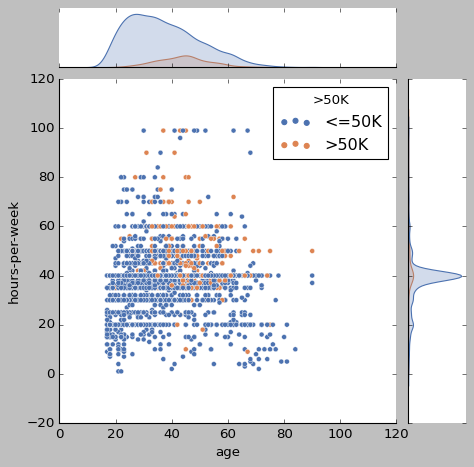

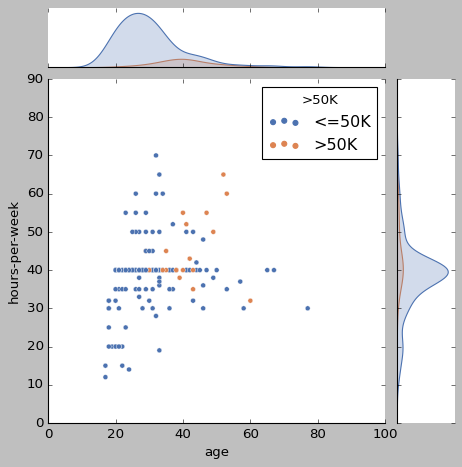

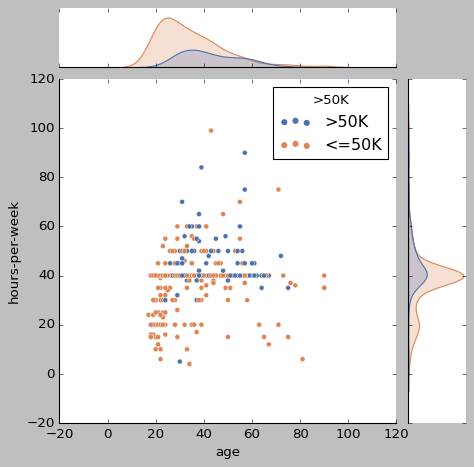

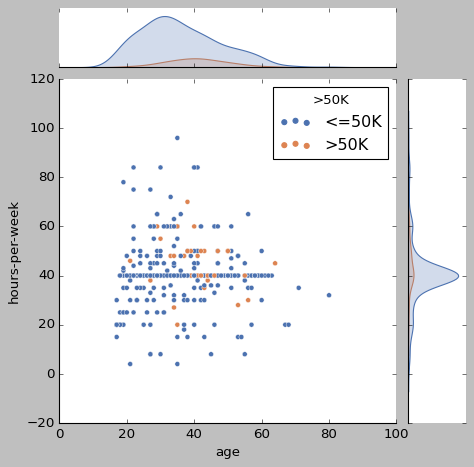

In [37]:

#in this scatter grid we can see that people who get more than 50k are outnumbered. we cross the age with hours per week on global scale by race (not only US)

#follow the dictionary of every graph

# 1 white
# 2 black
# 3 other
# 4 asian pac islander
# 5 Amer Indian Eskino

grid.map(sns.jointplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid.add_legend()

# Global Scaling!
i am going to do the same for all the countries now.

## **By sex:**

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:643: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:648: UserWarning: Using the pointplot function without specifying `hue_order` is likely to produce an incorrect plot.
  warnings.warn(warning)


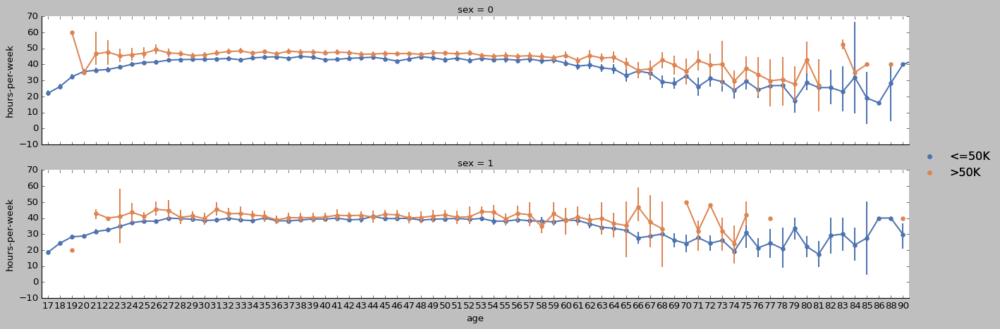

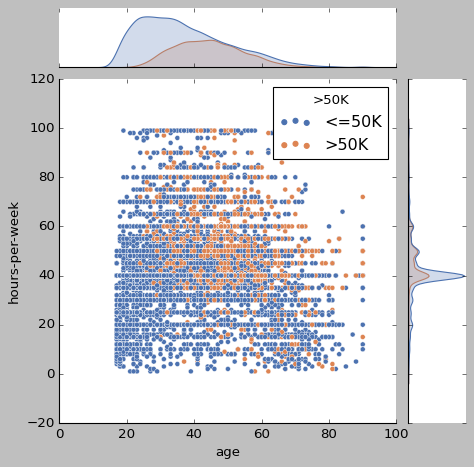

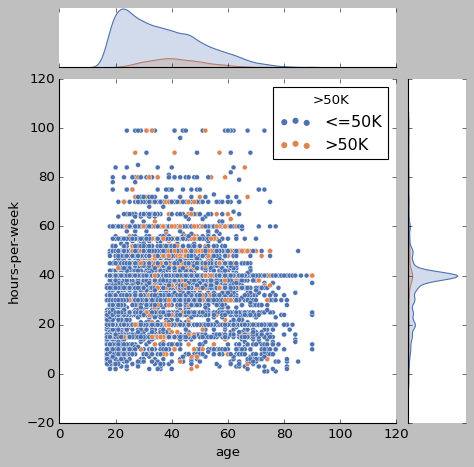

In [43]:
grid2 = sns.FacetGrid(master, row='sex', size=3, aspect=5) 
plt.xticks(np.arange(15, 95, 5))   #will give me order.
plt.grid(axis='x')
grid2.map(sns.pointplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid2.add_legend()
grid2.map(sns.jointplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid2.add_legend()

## **By Race:**

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:643: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:648: UserWarning: Using the pointplot function without specifying `hue_order` is likely to produce an incorrect plot.
  warnings.warn(warning)


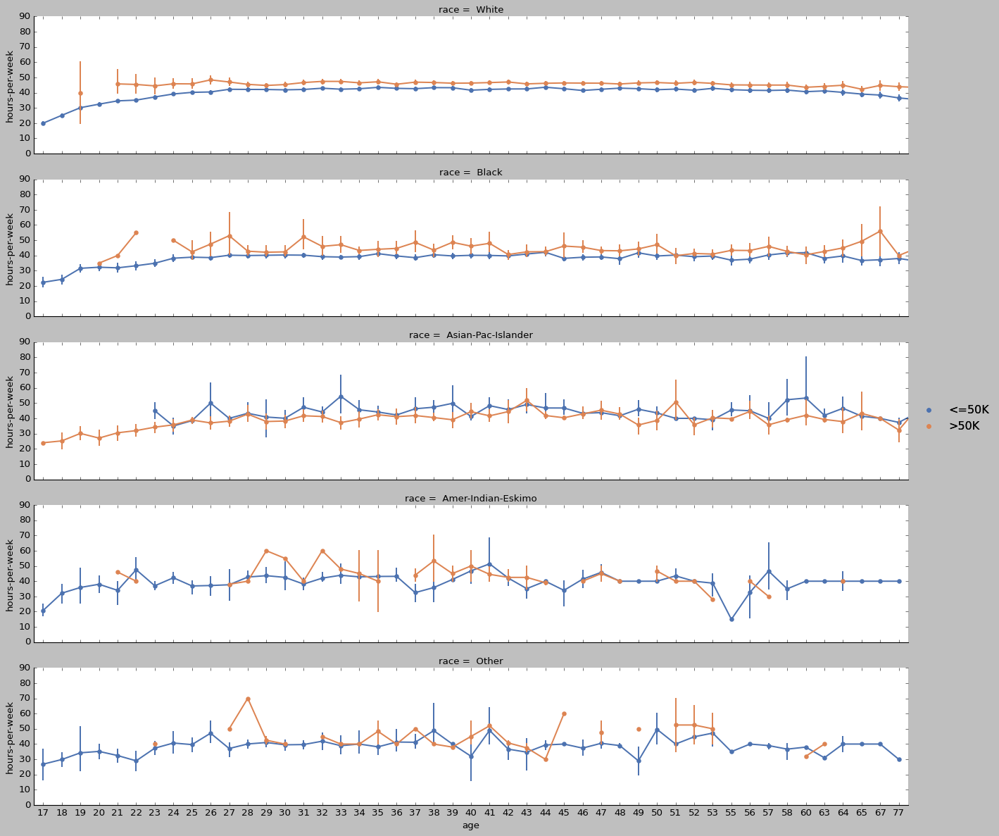

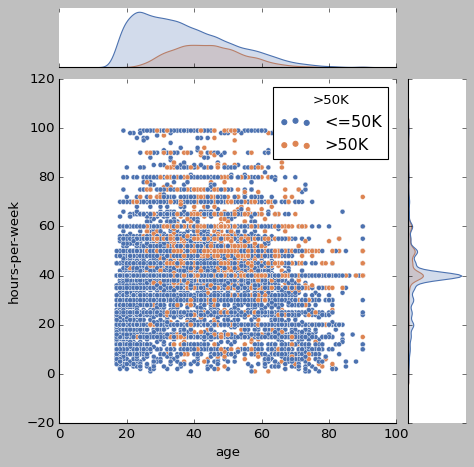

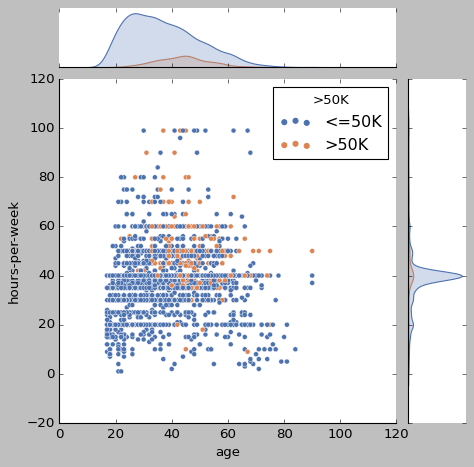

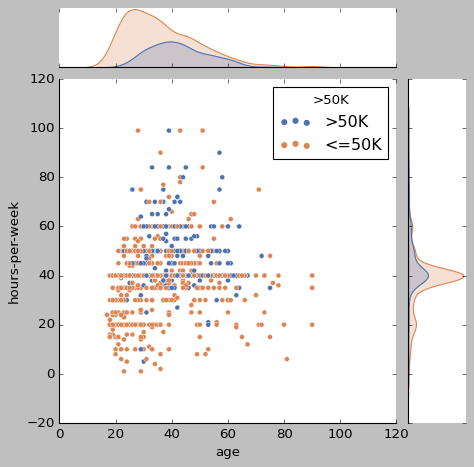

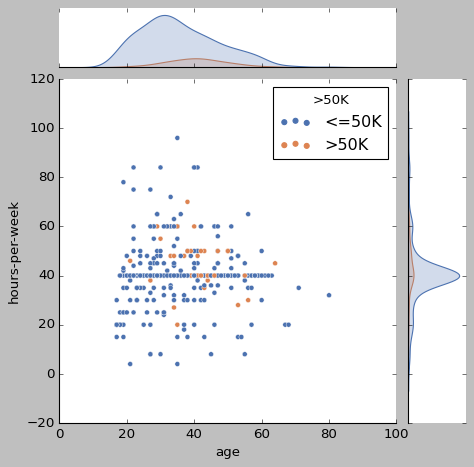

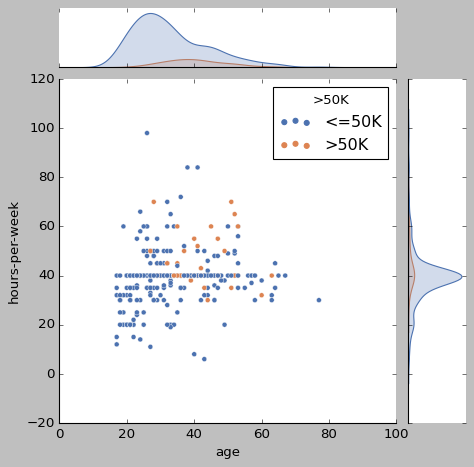

In [44]:
grid2 = sns.FacetGrid(master, row='race', size=3, aspect=5) 
plt.xticks(np.arange(15, 95, 5))   #will give me order.
plt.grid(axis='x')
grid2.map(sns.pointplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid2.add_legend()
grid2.map(sns.jointplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid2.add_legend()

## **By Native-Country:**

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:643: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:648: UserWarning: Using the pointplot function without specifying `hue_order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:1598: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume

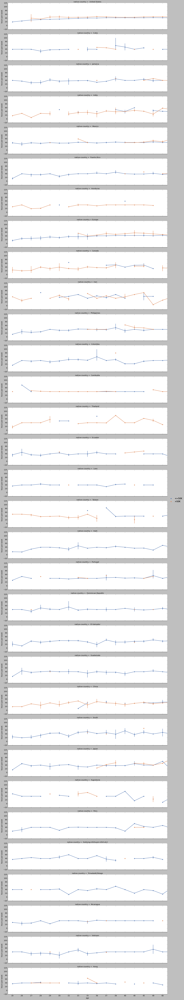

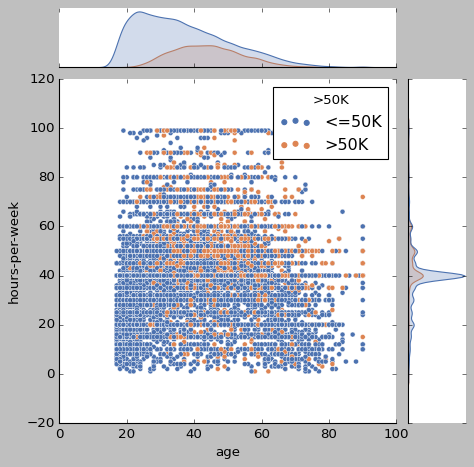

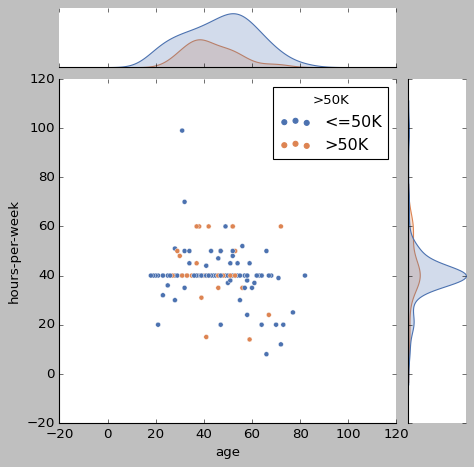

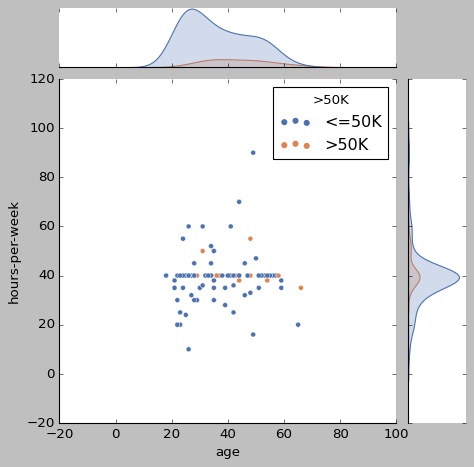

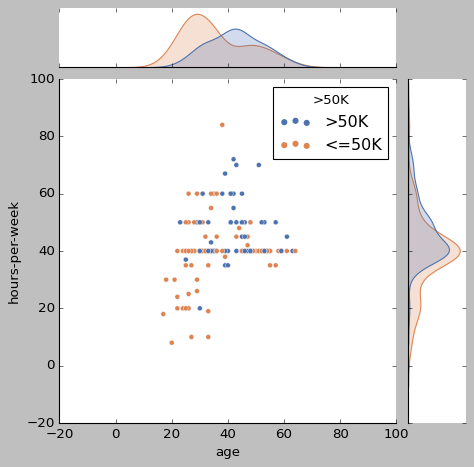

...

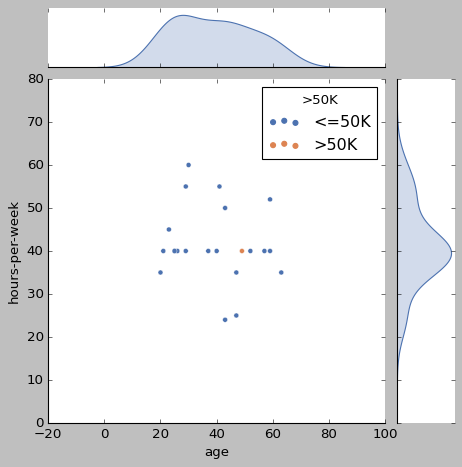

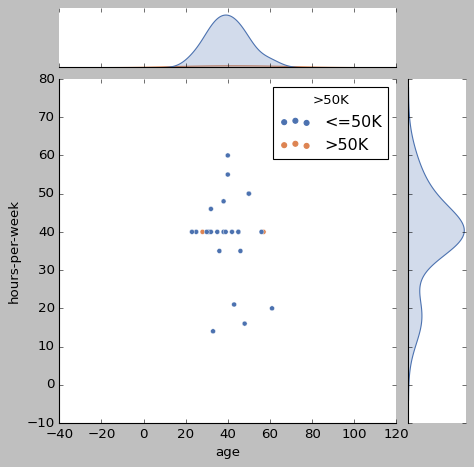

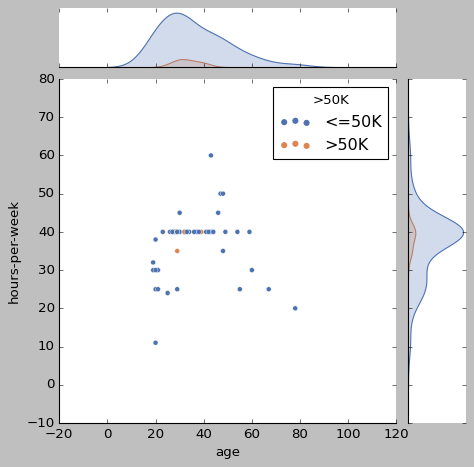

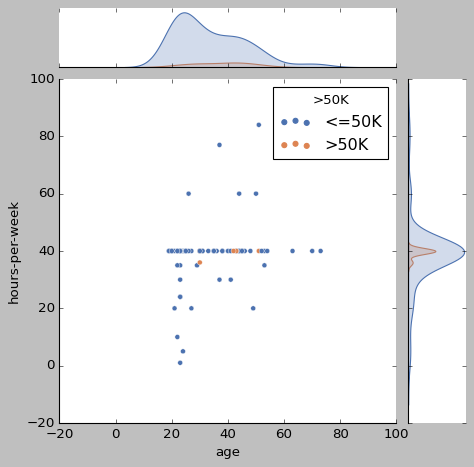

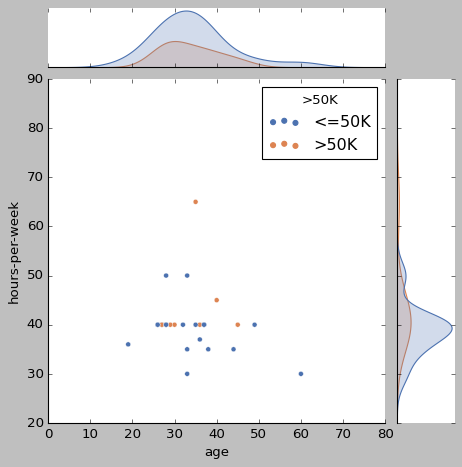

In [45]:
grid2 = sns.FacetGrid(master, row='native-country', size=3, aspect=5) 
plt.xticks(np.arange(15, 95, 5))   #will give me order.
plt.grid(axis='x')
grid2.map(sns.pointplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid2.add_legend()
grid2.map(sns.jointplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid2.add_legend()

##**By Relationship:**

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:643: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:648: UserWarning: Using the pointplot function without specifying `hue_order` is likely to produce an incorrect plot.
  warnings.warn(warning)


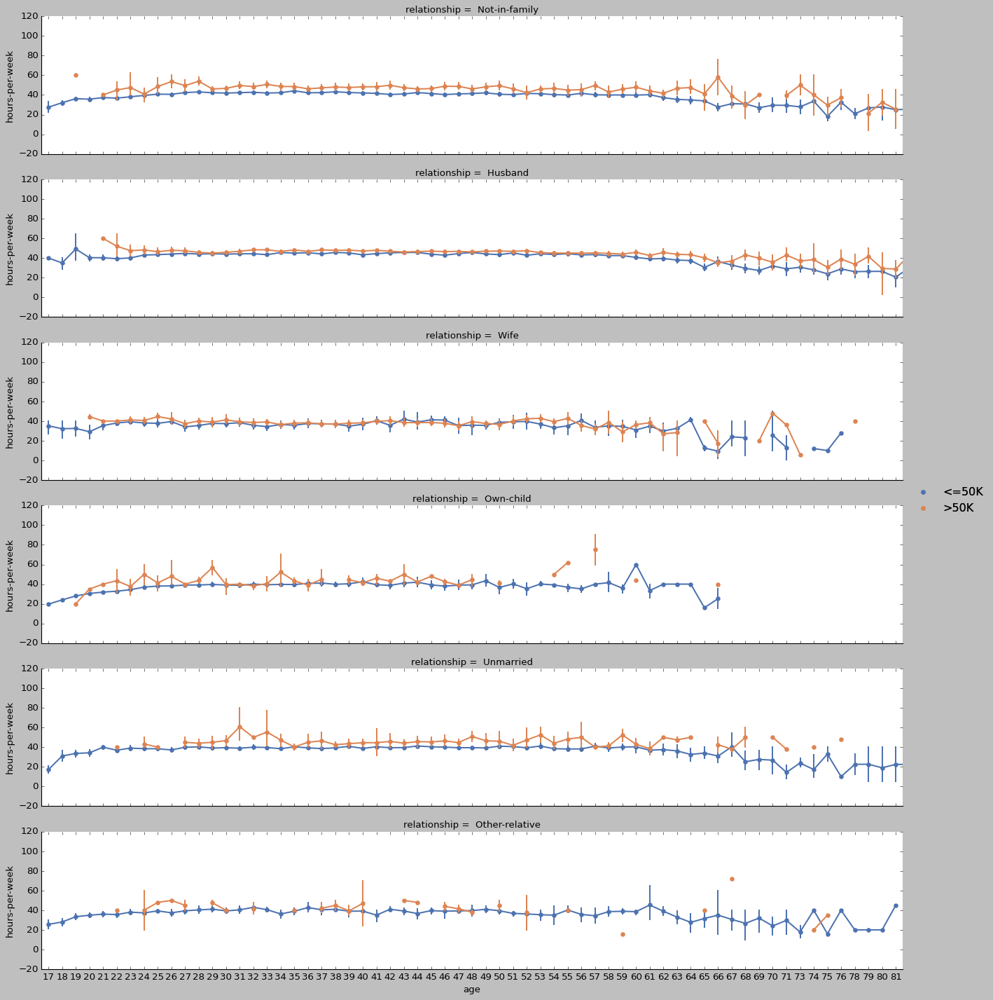

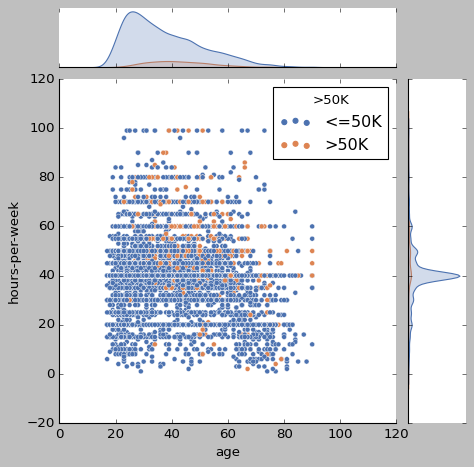

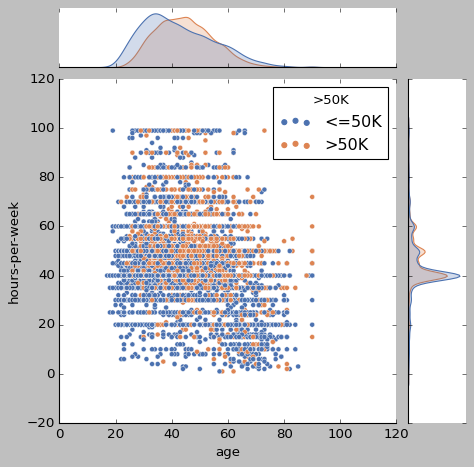

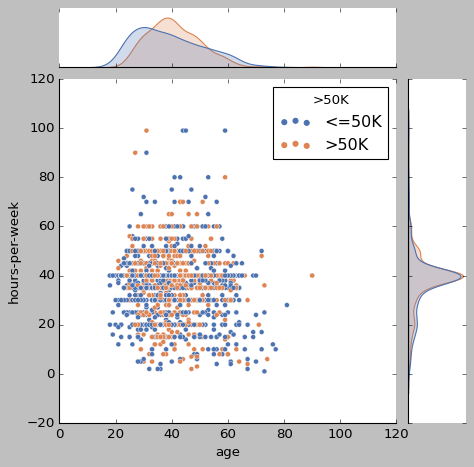

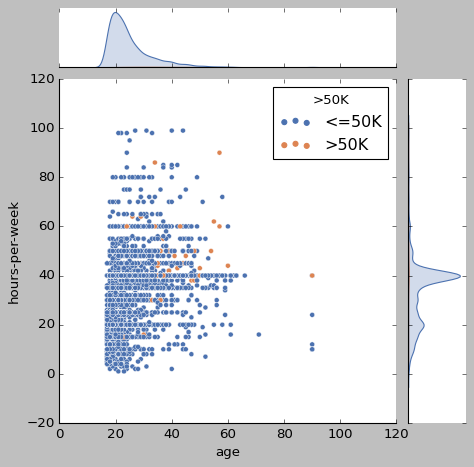

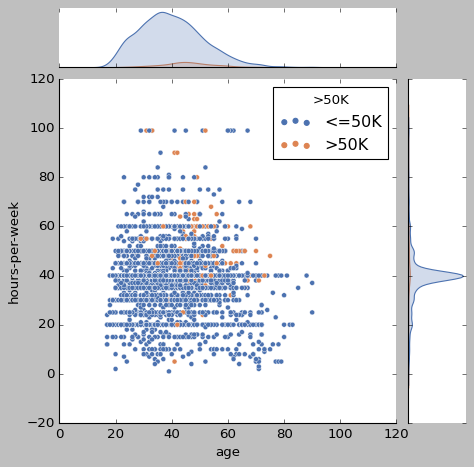

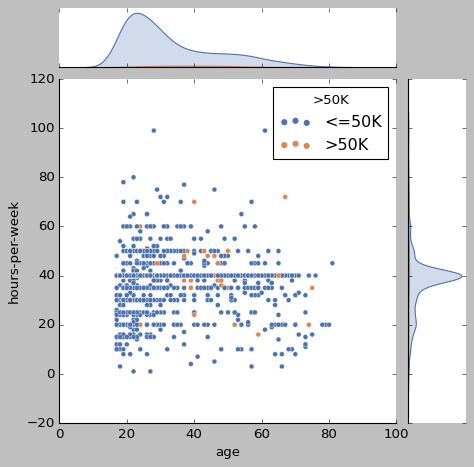

In [46]:
grid2 = sns.FacetGrid(master, row='relationship', size=3, aspect=5) 
plt.xticks(np.arange(15, 95, 5))   #will give me order.
plt.grid(axis='x')
grid2.map(sns.pointplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid2.add_legend()
grid2.map(sns.jointplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid2.add_legend()

##**By Education:**

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:643: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:648: UserWarning: Using the pointplot function without specifying `hue_order` is likely to produce an incorrect plot.
  warnings.warn(warning)


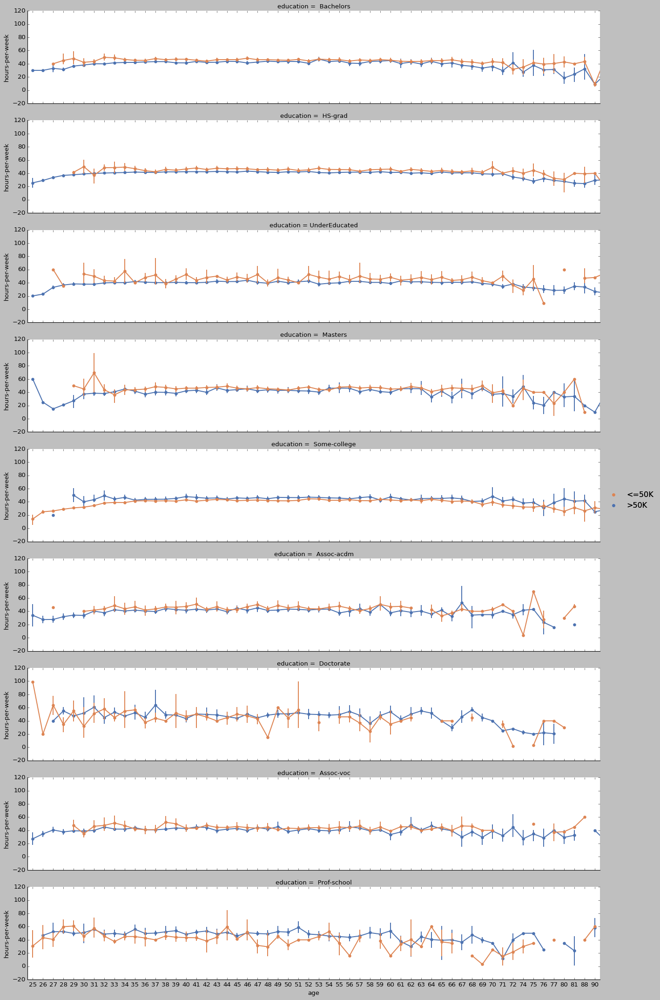

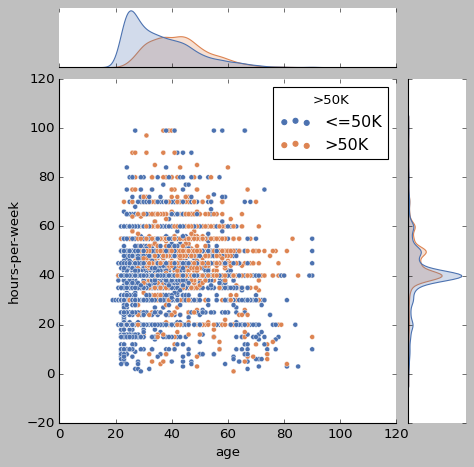

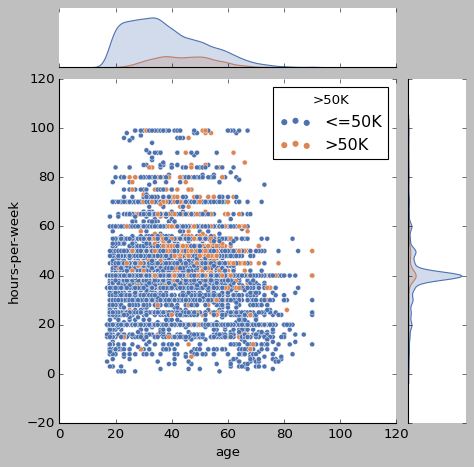

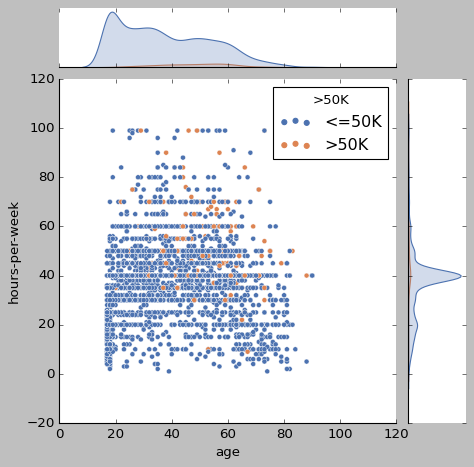

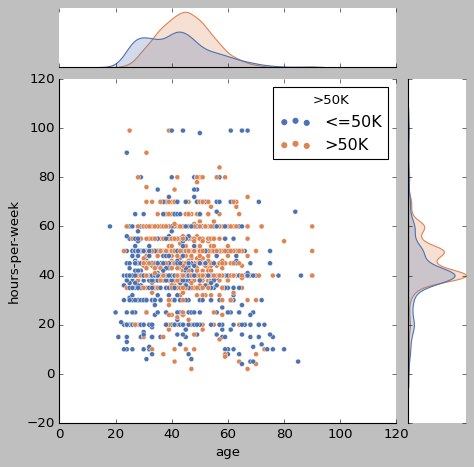

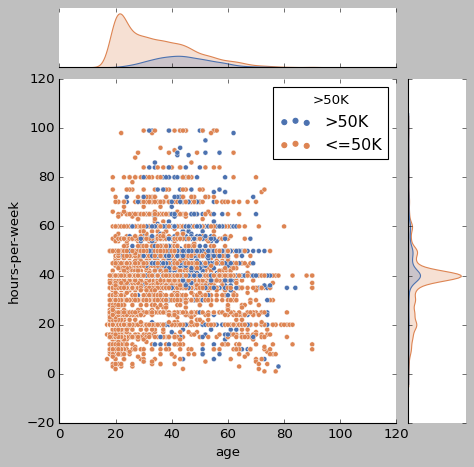

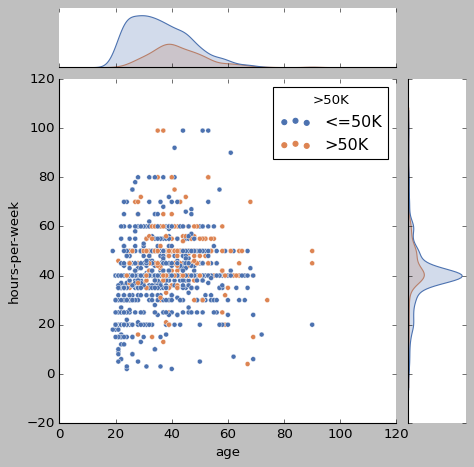

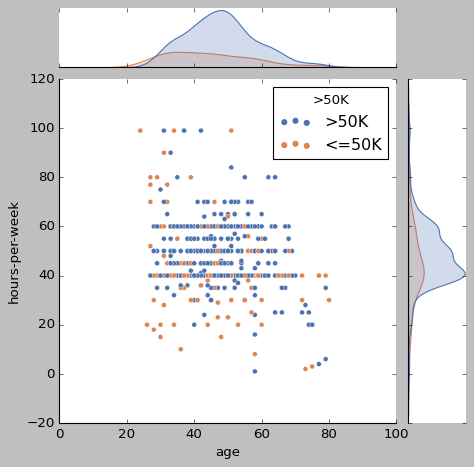

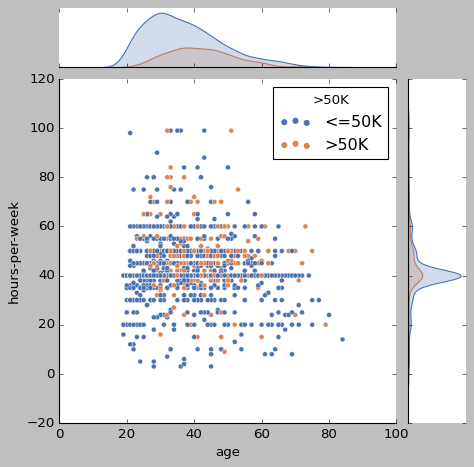

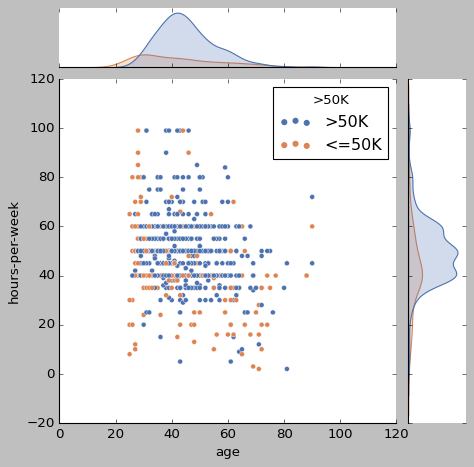

In [47]:
grid2 = sns.FacetGrid(master, row='education', size=3, aspect=5) 
plt.xticks(np.arange(15, 95, 5))   #will give me order.
plt.grid(axis='x')
grid2.map(sns.pointplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid2.add_legend()
grid2.map(sns.jointplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid2.add_legend()

##**By Workclass:**

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:643: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:648: UserWarning: Using the pointplot function without specifying `hue_order` is likely to produce an incorrect plot.
  warnings.warn(warning)


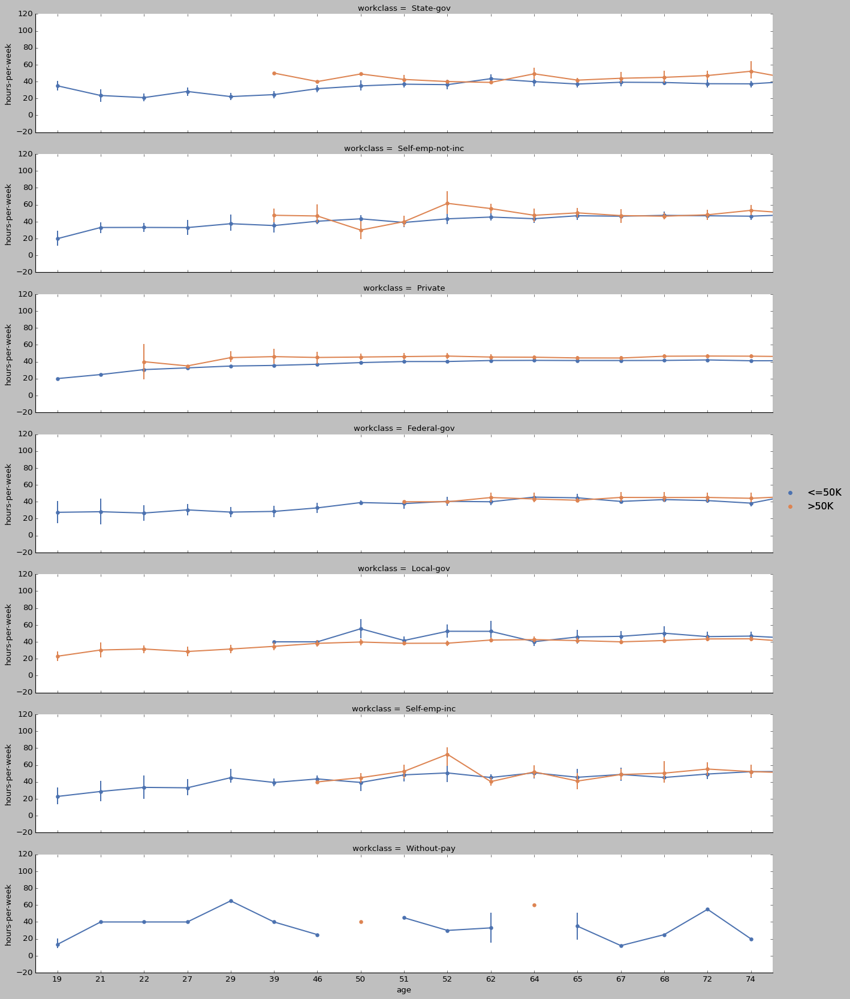

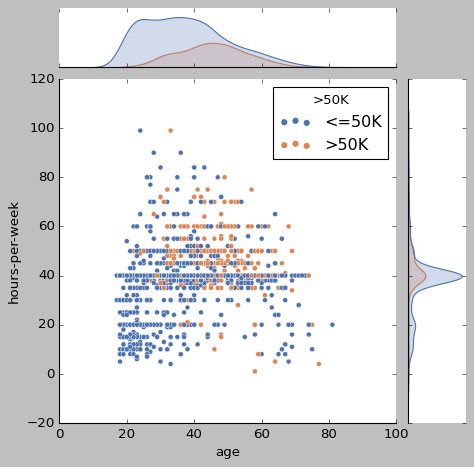

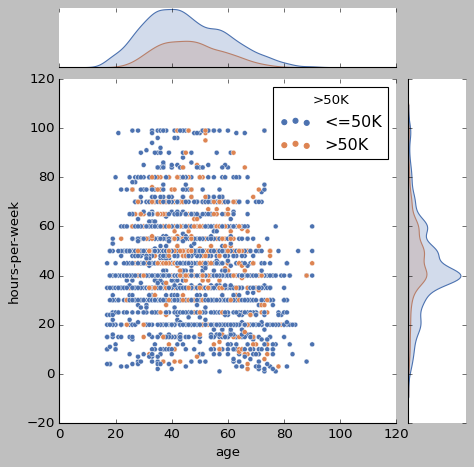

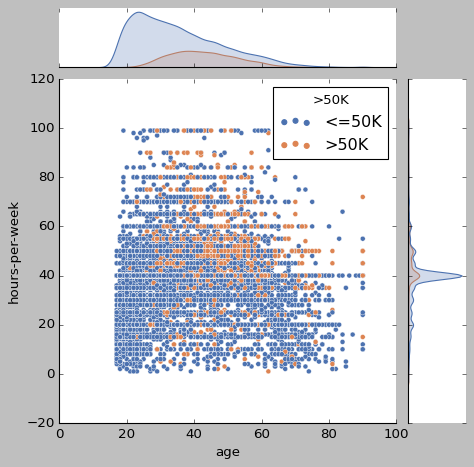

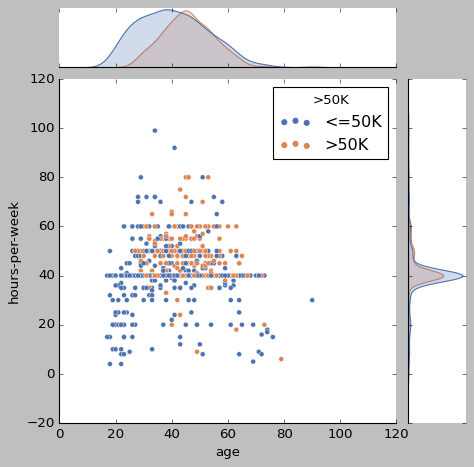

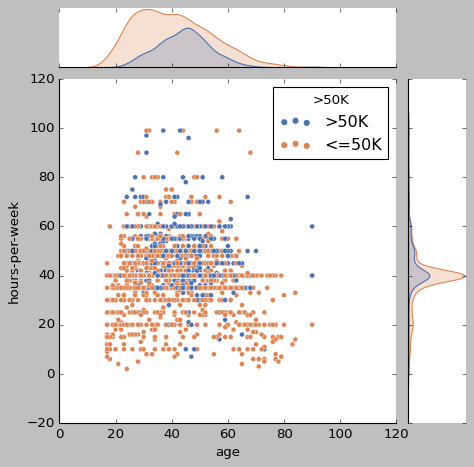

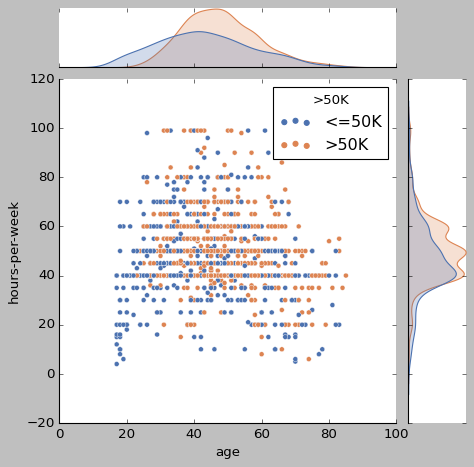

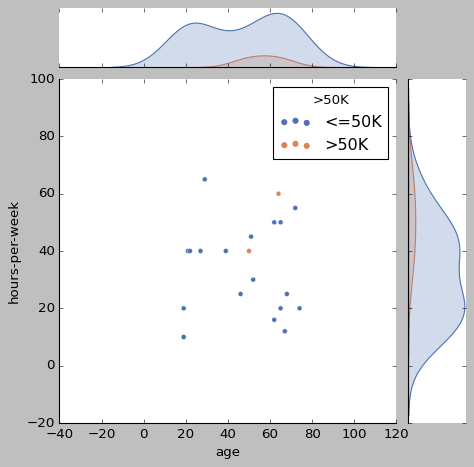

In [48]:
grid2 = sns.FacetGrid(master, row='workclass', size=3, aspect=5) 
plt.xticks(np.arange(15, 95, 5))   #will give me order.
plt.grid(axis='x')
grid2.map(sns.pointplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid2.add_legend()
grid2.map(sns.jointplot, 'age', 'hours-per-week', '>50K', palette='deep')
grid2.add_legend()
# 1. state-gov
# 2. self-emp-not-inc
# 3. private
# 4. deferal-gov
# 5. local-gov
# 6. self-emp-inc
# 7. without-pay

#**DataFrame:**

In [ ]:
master

## WE will see here each country. age, hours-per-week, 

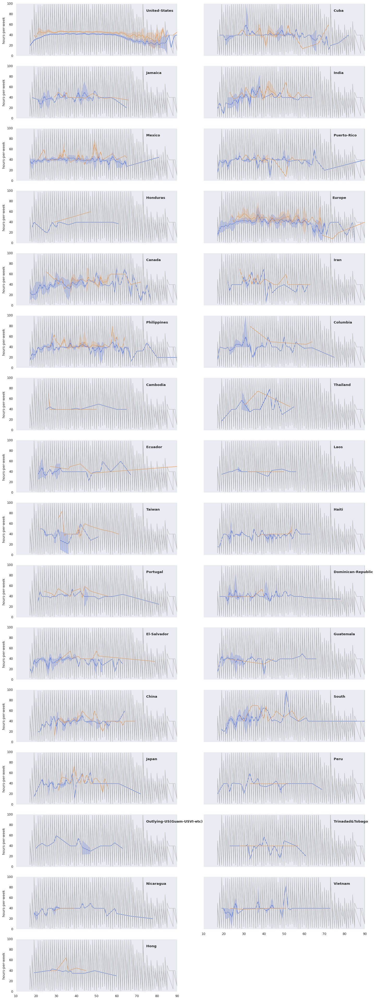

In [51]:
import seaborn as sns

sns.set_theme(style="dark")

# Plot each age's time series in its own facet
g = sns.relplot(data=master,x="age", y="hours-per-week", col="native-country", hue=">50K", kind="line", palette="bright", linewidth=1, zorder=2, col_wrap=2, height=3, aspect=3, legend=False)

# Iterate over each subplot to customize further
for age, ax in g.axes_dict.items():

    # Add the title as an annotation within the plot
    ax.text(.8, .85, age, transform=ax.transAxes, fontweight="bold")

    # Plot every year's time series in the background
    sns.lineplot(data=master, x="age", y="hours-per-week", units="sex", estimator=None, color=".7", linewidth=1, ax=ax)

# Reduce the frequency of the x axis ticks
#ax.set_xticks(ax.get_xticks()[::2])

# Tweak the supporting aspects of the plot
g.set_titles("")
g.set_axis_labels("", "hours-per-week")
g.tight_layout()

## Back To The US:

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:643: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


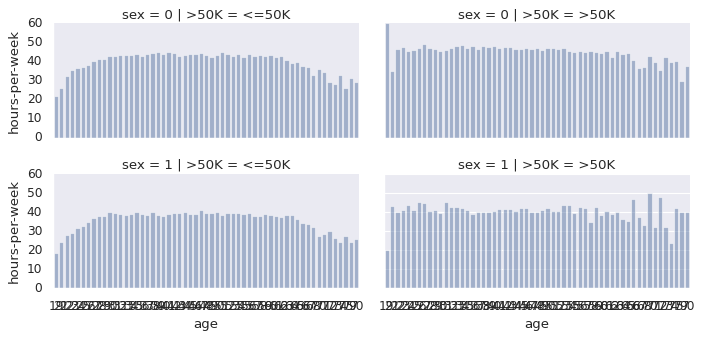

In [52]:
grid2 = sns.FacetGrid(master, row='sex', col='>50K', size=2.2, aspect=2, gridspec_kws=None) #USA
plt.xticks(np.arange(15, 95, 5))   #will give me order.
plt.grid(axis='both')
grid2.map(sns.barplot, 'age', 'hours-per-week', alpha=.5, ci=None)
grid2.add_legend()

#Using Dictionary function for 50k<


In [92]:
master

,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,hours-per-week,native-country,>50K
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,0,40,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,0,13,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,0,40,United-States,<=50K
3,53,Private,UnderEducated,1,Married-civ-spouse,Handlers-cleaners,Husband,Black,0,40,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,1,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...
48836,33,Private,Bachelors,13,Never-married,Prof-specialty,Own-child,White,0,40,United-States,<=50K
48837,39,Private,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,1,36,United-States,<=50K
48839,38,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,0,50,United-States,<=50K
48840,44,Private,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,0,40,United-States,<=50K


In [94]:
#*** Here we use a dictionary function in order to sum our data by value counts. Under only dataset of above 50k income****

# here we made a specific dataset of the requested issue
master50K = master.loc[master['>50K'].str.contains('>50K')]

master50K
#print(masterUSAFe)
#print(masterUSAMa)
#master50K['education'].describe
print(master50K['education'].mode().all())
print(master50K['workclass'].mode().all())
print(master50K['native-country'].mode().all())
print(master50K['marital-status'].mode().all())
print(master50K['occupation'].mode().all())
print(master50K['race'].mode().all())



 Bachelors
 Private
 United-States
 Married-civ-spouse
 Exec-managerial
 White


In [88]:
#reset counter:
d = {}
for i in master50K['education']:
   d[i] = 0
# Check if the reset worked:
# print(d)


{' Assoc-acdm': 0,
 ' Assoc-voc': 0,
 ' Bachelors': 0,
 ' Doctorate': 0,
 ' HS-grad': 0,
 ' Masters': 0,
 ' Prof-school': 0,
 ' Some-college': 0,
 'UnderEducated': 0}

In [89]:
for i in master50K['education']:
  d[i] = d[i]+1
d

{' Assoc-acdm': 398,
 ' Assoc-voc': 504,
 ' Bachelors': 3178,
 ' Doctorate': 399,
 ' HS-grad': 2416,
 ' Masters': 1393,
 ' Prof-school': 592,
 ' Some-college': 1990,
 'UnderEducated': 338}

In [90]:

d={}
for i in master50K['age']:
  d[i] = 0
for i in master50K['age']:
  d[i] = d[i]+1
d


{19: 2,
 20: 1,
 21: 6,
 22: 15,
 23: 21,
 24: 43,
 25: 75,
 26: 83,
 27: 107,
 28: 174,
 29: 194,
 30: 243,
 31: 269,
 32: 290,
 33: 287,
 34: 340,
 35: 323,
 36: 390,
 37: 411,
 38: 399,
 39: 414,
 40: 383,
 41: 413,
 42: 410,
 43: 400,
 44: 399,
 45: 402,
 46: 429,
 47: 418,
 48: 323,
 49: 303,
 50: 362,
 51: 338,
 52: 265,
 53: 279,
 54: 236,
 55: 194,
 56: 175,
 57: 192,
 58: 187,
 59: 181,
 60: 122,
 61: 124,
 62: 86,
 63: 78,
 64: 76,
 65: 54,
 66: 47,
 67: 45,
 68: 30,
 69: 24,
 70: 20,
 71: 22,
 72: 11,
 73: 15,
 74: 18,
 75: 12,
 76: 5,
 77: 6,
 78: 5,
 79: 6,
 80: 3,
 81: 6,
 83: 2,
 84: 1,
 85: 1,
 88: 1,
 90: 12}

# **Trying out different modules:**

first of all we'll make all of our data numerical for the modules to work on 

**after examination, we'll drop education, and make all of our other data numerical**

In [53]:
master=master.drop("education",axis=1)
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
master["workclass"]= le.fit_transform(master["workclass"])
master["marital-status"]= le.fit_transform(master["marital-status"])
master["occupation"]= le.fit_transform(master["occupation"])
master["relationship"]= le.fit_transform(master["relationship"])
master["race"]= le.fit_transform(master["race"])
master["native-country"]= le.fit_transform(master["native-country"])
master[">50K"]= le.fit_transform(master[">50K"])

## **now when all of our data is numerical we can use the data in all of our modules**

In [54]:
X = master.drop(">50K", axis=1)
Y = master[">50K"]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.25, random_state=42)

In [55]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [56]:
from sklearn.svm import SVC
classifier = SVC(kernel = 'rbf', random_state = 0)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)

In [57]:
from sklearn.metrics import accuracy_score
classifier.score(X_train, y_train)
classifier = round(classifier.score(X_train, y_train) * 100, 2)
classifier

82.93

In [58]:
def classifiers_run (num, X_train, y_train, X_test, y_test, n, nn=5):
  if (num == 1):
      clf = KNeighborsClassifier(n_neighbors=nn)
  elif (num == 2):
      clf = DecisionTreeClassifier(max_depth=nn)
  elif (num == 3):
      clf = RandomForestClassifier(n_estimators=n, max_depth=nn)
  elif (num == 4):
      clf = AdaBoostClassifier(n_estimators=n)
  elif (num == 5):
      clf = linear_model.Lasso(alpha=(nn))
  clf.fit(X_train, y_train)
  Y_train_pred = clf.predict(X_train)
  Y_test_pred = clf.predict(X_test)
  train_score = clf.score(X_train, y_train)
  test_score = clf.score(X_test, y_test)
  mse = metrics.mean_squared_error(y_test, Y_test_pred)
  return clf, train_score, test_score, Y_train_pred, Y_test_pred, num, mse


In [59]:
n=100
for j in range(1,6):
  if j == 1:
    for i in range(5,26,10):
      clf, train_score, test_score, Y_train_pred, Y_test_pred, num, mse = classifiers_run(j, X_train, y_train, X_test, y_test,n,i)
      print("the train score for KNN with", i, "neighboors is:", train_score, " and the test score is:", test_score, "the MSE score is", mse)
  elif j == 2:
    for i in range(5,26,10):
      clf, train_score, test_score, Y_train_pred, Y_test_pred, num, mse = classifiers_run(j, X_train, y_train, X_test, y_test,n,i)
      print("the train score for Desicion Trees with", i, "max depth is:", train_score, " and the test score is:", test_score, "the MSE score is", mse)
  elif j == 3:
    for i in range(5,26,10):
      clf, train_score, test_score, Y_train_pred, Y_test_pred, num, mse = classifiers_run(j, X_train, y_train, X_test, y_test,n,i)
      print("the train score for Random Forest with", i, "max depth is:", train_score, " and the test score is:", test_score, "the MSE score is", mse)
  elif j == 5:
    for i in range(5,26,10):
      k = (100-i)/100
      clf, train_score, test_score, Y_train_pred, Y_test_pred, num, mse = classifiers_run(j, X_train, y_train, X_test, y_test,n,k)
      print("the train score for Lasso Regression with", k, "alfa is:", train_score, " and the test score is:", test_score, "the MSE score is", mse)
  elif j == 4:
    clf, train_score, test_score, Y_train_pred, Y_test_pred, num, mse = classifiers_run(j, X_train, y_train, X_test, y_test,n)
    print("the train score for AdaBoost is:", train_score, "and the test score is:", test_score, "the MSE score is", mse)

the train score for KNN with 5 neighboors is: 0.8642528600070764  and the test score is: 0.8116044578100123 the MSE score is 0.1883955421899876
the train score for KNN with 15 neighboors is: 0.8442917796910013  and the test score is: 0.8238988147886078 the MSE score is 0.17610118521139217
the train score for KNN with 25 neighboors is: 0.8395742422455478  and the test score is: 0.8258446842384575 the MSE score is 0.17415531576154256
the train score for Desicion Trees with 5 max depth is: 0.8211463615992451  and the test score is: 0.8182381036617725 the MSE score is 0.18176189633822748
the train score for Desicion Trees with 15 max depth is: 0.8946514919212172  and the test score is: 0.8086856536352379 the MSE score is 0.19131434636476208
the train score for Desicion Trees with 25 max depth is: 0.9557436018398396  and the test score is: 0.7803820980010614 the MSE score is 0.21961790199893863
the train score for Random Forest with 5 max depth is: 0.8201144002830523  and the test score is:

**we can quite easily see that the best score is for random forest at max depth of 15, yet the best mse score is forrandom forest at max depth of 25**

## **we'll check hyper parameters for random forest:**

In [60]:
for i in range(10,91,10):
  train_test_split
  n = i/100
  X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=n, random_state=42)
  classifier = RandomForestClassifier()
  train_score = clf.score(X_train, y_train)
  print("the score for", i, "% train test split is:" ,train_score)
train_score = clf.score(X, Y)
print("the score for 100 % train test split is:" ,train_score)

the score for 10 % train test split is: -2.8138826673185235e-06
the score for 20 % train test split is: -2.124375961809477e-07
the score for 30 % train test split is: -5.900688499593799e-06
the score for 40 % train test split is: -3.413791934336885e-05
the score for 50 % train test split is: -1.5074753330512891e-05
the score for 60 % train test split is: -3.947447652308256e-06
the score for 70 % train test split is: -1.3970238242011488e-05
the score for 80 % train test split is: -6.788287311687569e-05
the score for 90 % train test split is: -0.00024268251004433417
the score for 100 % train test split is: -1.0689110840012006e-05


we can see that for a 60 precent we got the best score.

BUT (big but) the score changes every time we run the program.